<a href="https://colab.research.google.com/github/pkhurt/computer-vision-course/blob/main/section_4_27_image_processing_blurring_smothing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [ ]:
# very good visualization: http://setosa.io/ev/image-kernels/

In [ ]:
DATA_DIR = "/content/drive/MyDrive/udemy/python_for_computervision_opencv/DATA/"

In [ ]:
def load_img():
  img = cv2.imread("/content/drive/MyDrive/udemy/python_for_computervision_opencv/DATA/bricks.jpg")
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

In [ ]:
def display_img(img):
  fig = plt.figure(figsize=(12,10))
  ax = fig.add_subplot(111)
  ax.imshow(img)

In [ ]:
def reset_and_reload_image():
  img = load_img()
  font = cv2.FONT_HERSHEY_COMPLEX
  cv2.putText(img, text="bricks", org=(10,600), fontFace=font, fontScale=10, color=(255,0,0), thickness=4)
  print("Reset and reload done.")
  return img

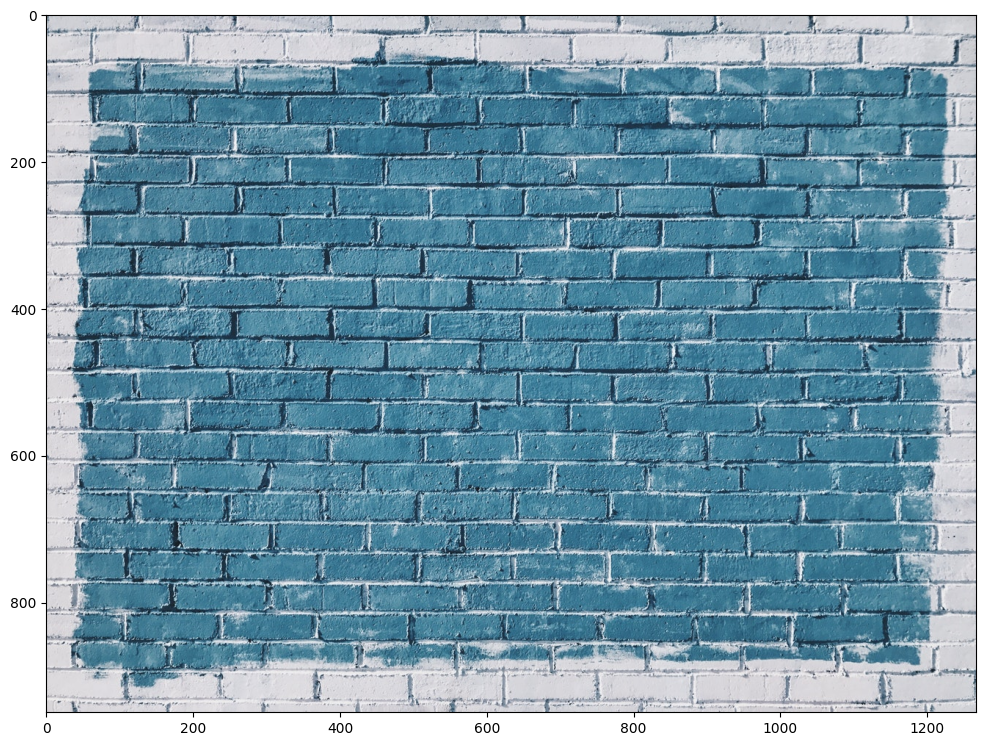

In [ ]:
img1 = load_img()
display_img(img1)

In [ ]:
# Gamma Correction: Increase / Decrease brightness of the image
gamma = 1/8
result = np.power(img1, gamma)

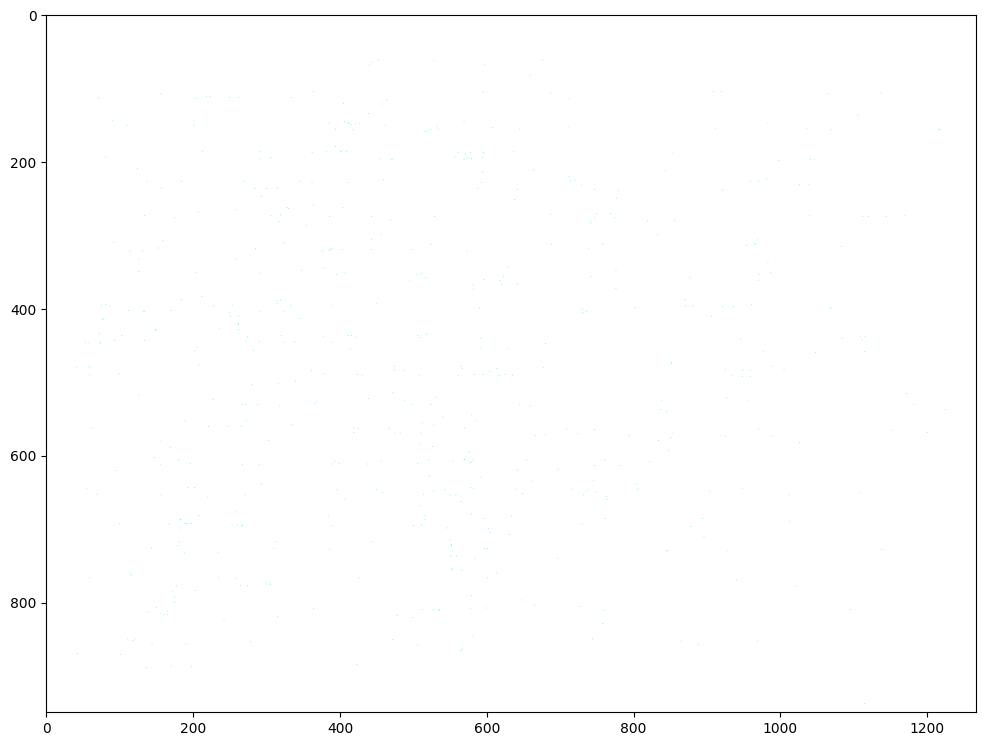

In [ ]:
display_img(result)

In [ ]:
# Blurring: Low pass filter with a two pass convolution
# Write text on image
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2, text="bricks", org=(10,600), fontFace=font, fontScale=10, color=(255,0,0), thickness=4)

array([[[200, 201, 206],
        [192, 197, 203],
        [185, 195, 204],
        ...,
        [198, 196, 201],
        [198, 196, 201],
        [198, 196, 201]],

       [[224, 225, 230],
        [195, 200, 206],
        [179, 192, 200],
        ...,
        [198, 196, 201],
        [198, 196, 201],
        [198, 196, 201]],

       [[218, 221, 228],
        [166, 173, 181],
        [124, 137, 146],
        ...,
        [198, 196, 201],
        [198, 196, 201],
        [198, 196, 201]],

       ...,

       [[217, 212, 216],
        [216, 211, 215],
        [215, 210, 214],
        ...,
        [206, 207, 212],
        [205, 208, 213],
        [208, 209, 214]],

       [[217, 212, 216],
        [216, 211, 215],
        [215, 210, 214],
        ...,
        [202, 205, 210],
        [202, 207, 211],
        [205, 208, 213]],

       [[217, 212, 216],
        [217, 212, 216],
        [215, 210, 214],
        ...,
        [203, 206, 211],
        [202, 207, 211],
        [204, 209, 213]]

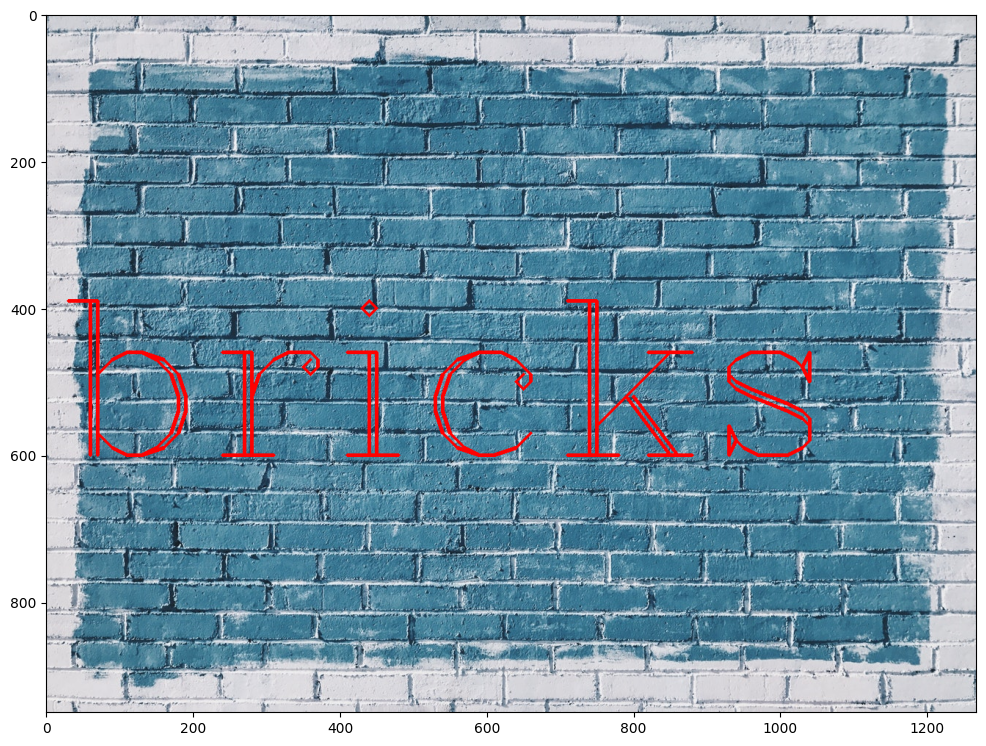

In [ ]:
display_img(img2)

In [ ]:
kernel = np.ones(shape=(5,5), dtype=np.float32) / 25  # Same as 1/25 * ones(5,5)

In [ ]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [ ]:
dst = cv2.filter2D(img2, -1, kernel)

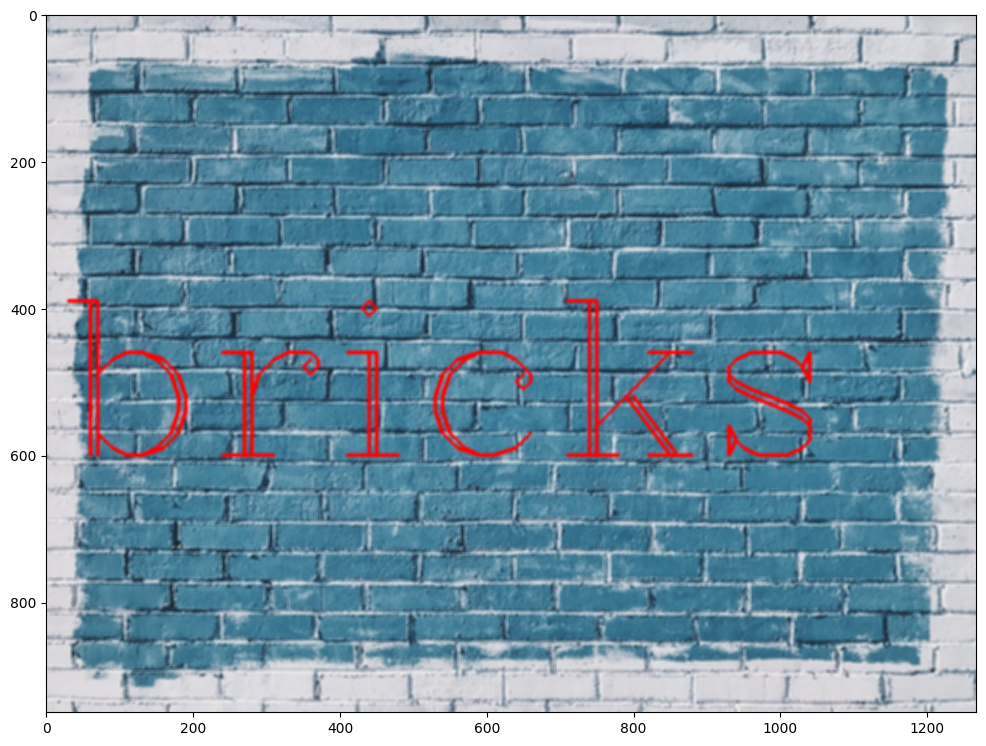

In [ ]:
display_img(dst)

In [ ]:
img3 = reset_and_reload_image()

Reset and reload done.


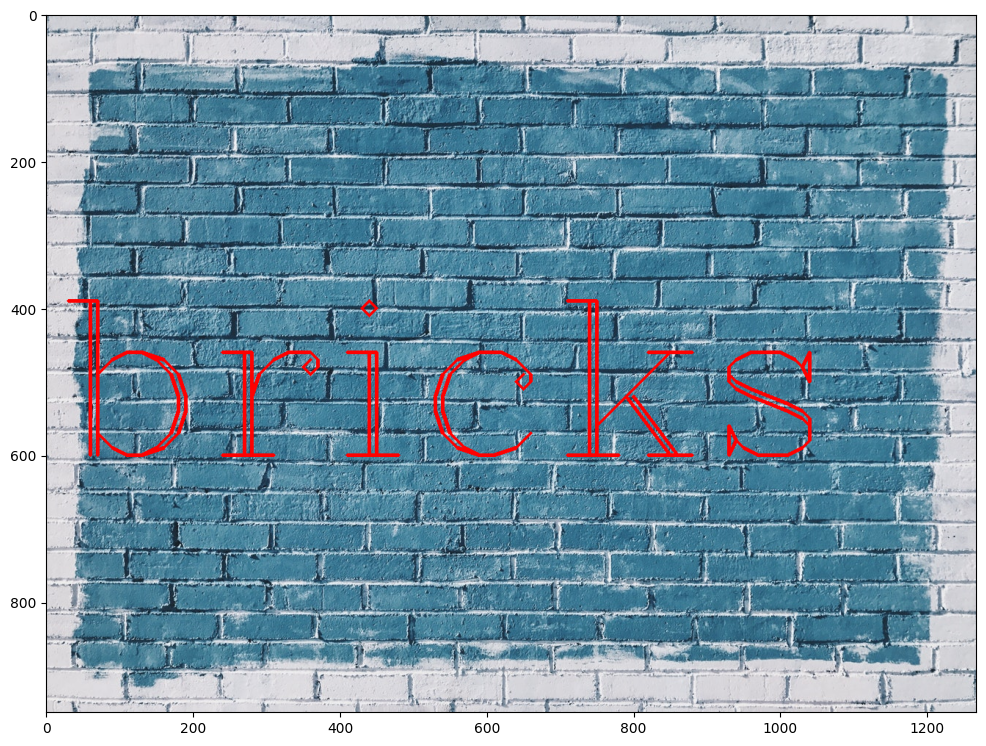

In [ ]:
display_img(img3)

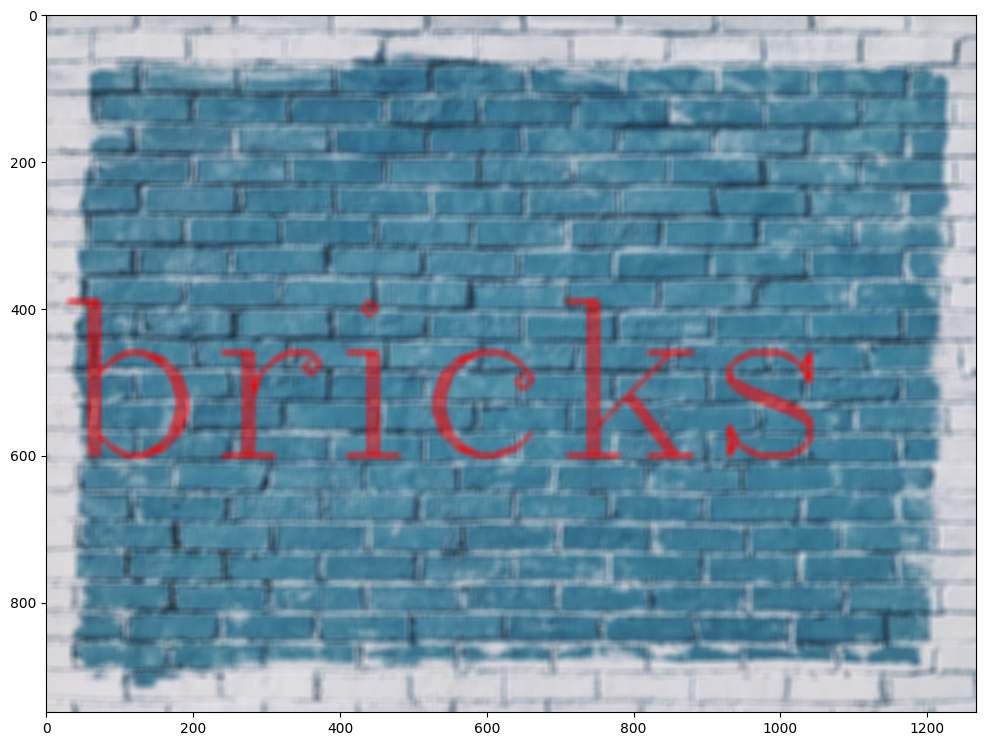

In [ ]:
# using cv2 blur function
blurred = cv2.blur(img3, ksize=(10,10))
display_img(blurred)

In [ ]:
# reset and apply gaussian
img4 = reset_and_reload_image()

Reset and reload done.


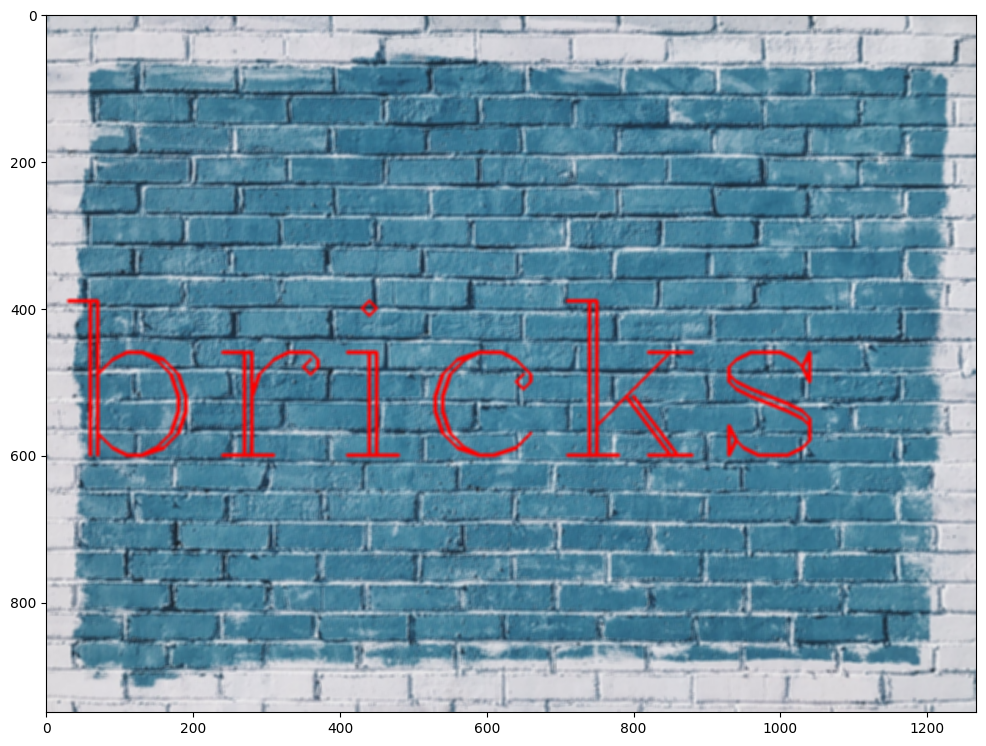

In [ ]:
blurred_gaussian_img = cv2.GaussianBlur(img4, (5,5), 10)
display_img(blurred_gaussian_img)

Reset and reload done.


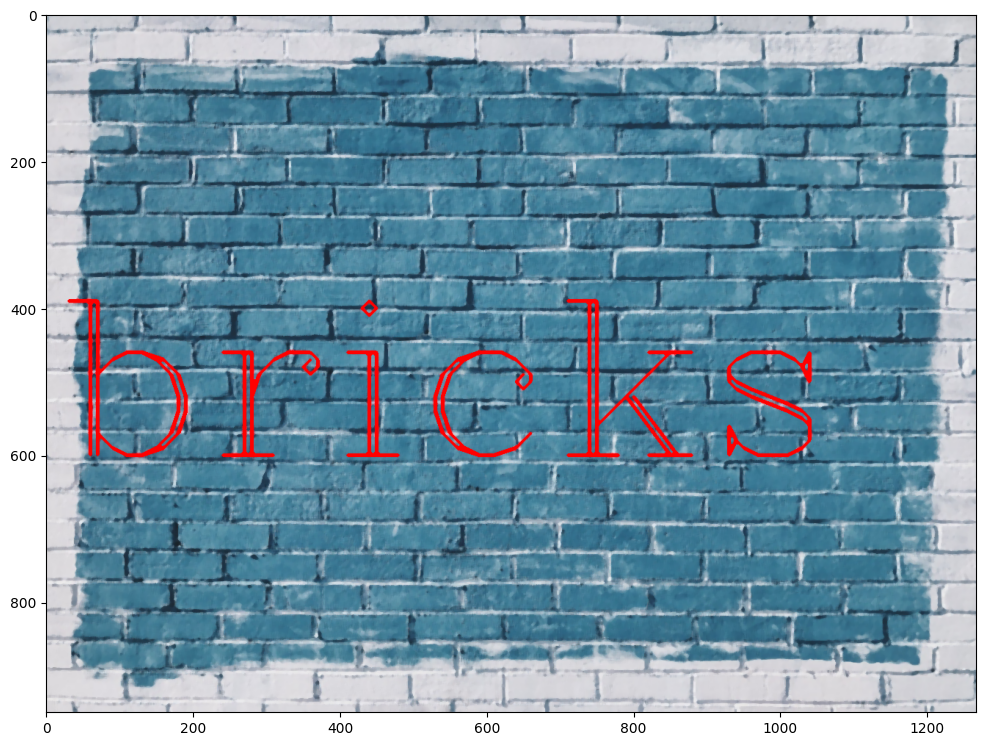

In [ ]:
# median blur -> remove image noise
img5 = reset_and_reload_image()
median_result = cv2.medianBlur(img5, 5)
display_img(median_result)

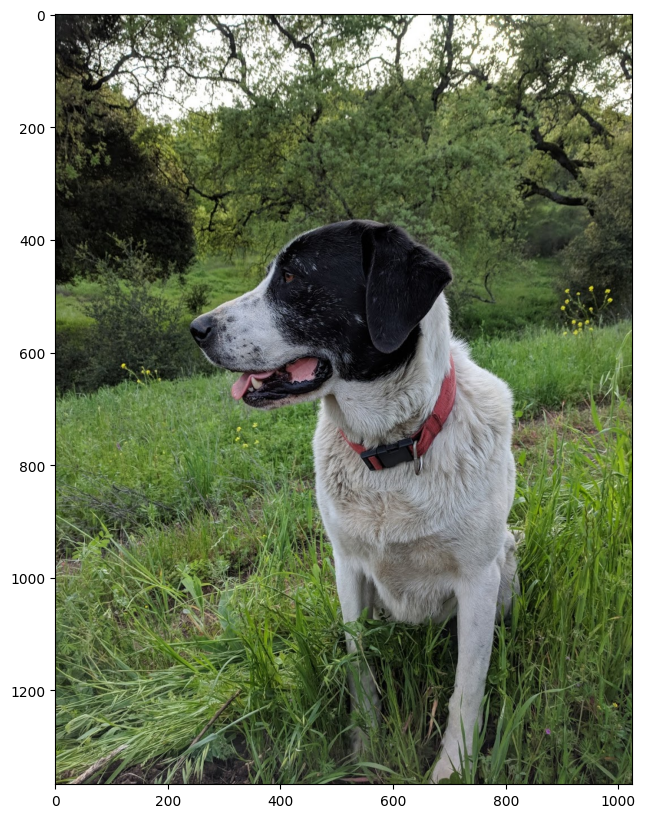

In [ ]:
# Lets have a closer look into the noise removal of a median filter with another image
img_dog = cv2.imread("/content/drive/MyDrive/udemy/python_for_computervision_opencv/DATA/sammy.jpg")
img_dog = cv2.cvtColor(img_dog, cv2.COLOR_BGR2RGB)
display_img(img_dog)

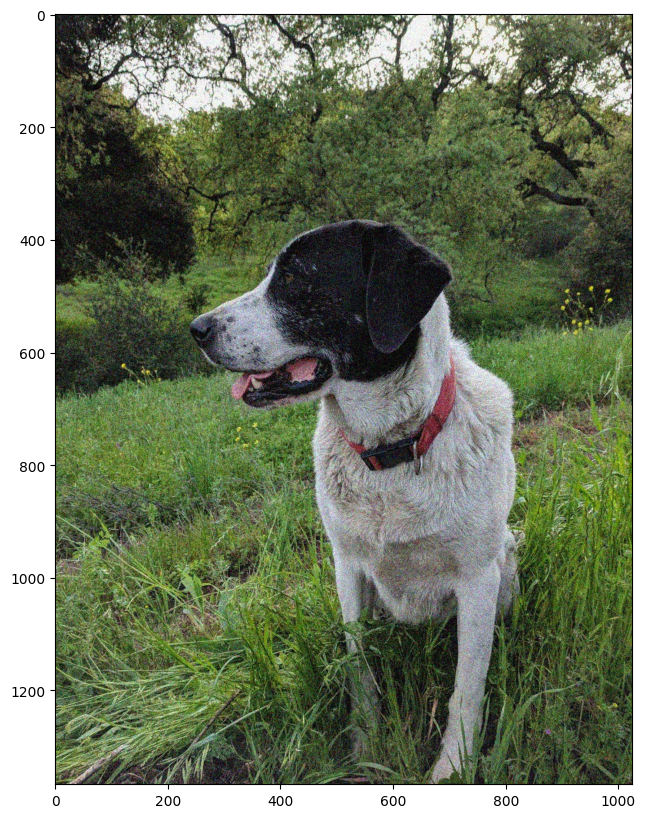

In [ ]:
# Try to correct the noise of an image using the medianBlur function
noise_img = cv2.imread(DATA_DIR + "/sammy_noise.jpg")
display_img(noise_img)

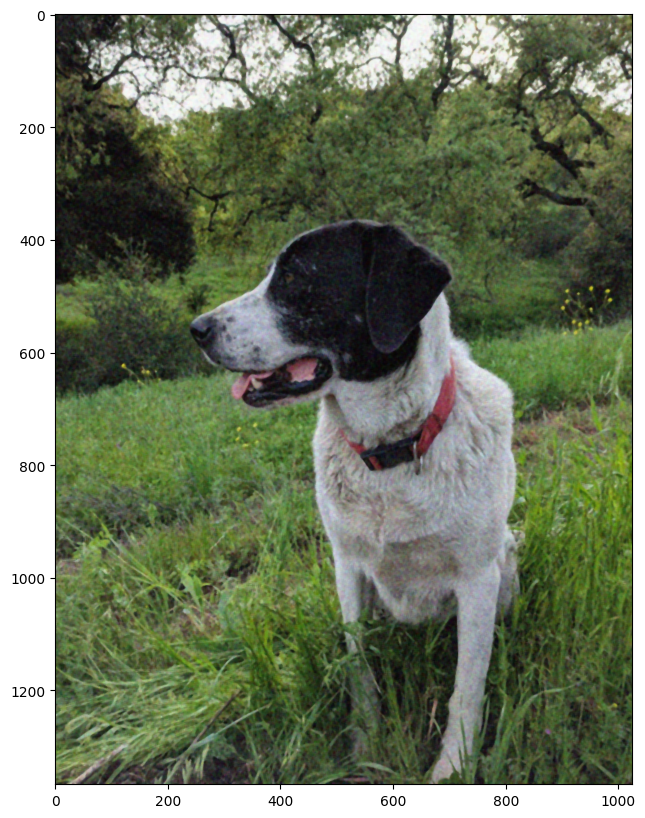

In [ ]:
# Try to fix the noise with median blur
# comes at the cost of a detail loss, because we remove the "random pixels" (the noise)
#   by smoothing the image with a 5x5 filter. We use the pixels sorroundings to
#   define the center pixels value.
median = cv2.medianBlur(noise_img, 5)
display_img(median)

# Neuer Abschnitt